# Scientific Computig With Python
## Final project: Heart Rate Estimation
<ul>
<li>Gianpietro Nicoletti 2053042: ICT for Internet and Multimedia(Cybersystems)</li>
<li>Matteo Varotto 2037034: ICT for Internet and Multimedia(Telcommunications)</li>
<li>Matteo Cogato 2026966: ICT for Internet and Multimedia(Cybersystems)</li>
</ul>



Seismocardiography ([SCG](https://www.ncbi.nlm.nih.gov/pubmed/24111357)) is a very promising technique to measure the Heart Rate (HR) and Respiratory Rate (RR) with a detector positioned above the sternum. It is generally based on accelerometer and gyroscope readings or a combination of them. 

Ballistocardiography ([BCG](https://en.wikipedia.org/wiki/Ballistocardiography)) is an another technique to estimate heart and respiratory rate with a combination of both an accelerometer and a gyroscope. It is an indirect evaluation of HR and RR since the contact between the device and the body of the subject is not required (e.g., the accelerometer platform can be mounted under the slats of the bed).   
  
MuSe (Multi-Sensor miniaturized, low-power, wireless [IMU](https://en.wikipedia.org/wiki/Inertial_measurement_unit)) is an Inertial Measurement Unit (IMU) provided by [221e](https://www.221e.com). In the context of this project, it allows to record the inertial data necessary for the estimation of SCG and BCG.

The goal of this assignment is to estimate the respiratory rate of an healthy subject, given the linear acceleration and angular velocity measurements recorded by using the aforementioned MuSe platform.

The study must be performed on two datasets: the first is the compulsory one (`center_sternum.txt`), while the second is left at the discretion of the group, among those made available for the assignment.

*Remember that normal heart rate is around [40-100] bpm.*

## Data

The data is provided in `.txt` files. During this study, two healthy subjects were involved with their informed consent. The first dataset was recorded on one subject, while all the other datasets were recorded on the second subject. 

This is the first mandatory file:

* `center_sternum.txt`: MuSe placed on the center of the sternum. The subject was lying supine on his left and right side, respectively. 


Choose one of the following files in order to complete the task.

* `1_Stave_supine_static.txt`: Sensor placed on a bed stave, under the mattress at the level of the chest. The subject was lying supine on his left and right side. 
* `2_Mattress_supine.txt`: Sensor placed on the mattress, near one corner but not under the pillow. The subject laid in the same position as above. 
* `3_Subject_sitting_chair.txt`: Sensor placed on the desk: the subject, sitting on a chair, leaned forearms and hands on the desk. 
* `4_Chest_sweater.txt`: Sensor placed on the subject chest directly on a sweater. 
* `5_Under_chair.txt`: Subject sitting on a chair, sensor placed under the seat of the chair. 

All `.txt` files have 16 columns, containing: 

* Log Freq stands for the acquisition in Hz (i.e., sampling interval is constant).
* AccX, AccY, AccZ are the measured magnitude of linear acceleration along each axis.
* GyroX, GyroY, GyroZ are the measured magnitude of angular velocity along each axis.
* MagnX, MagnY, MagnZ are the measured magnitude of magnetic field along each axis.
* qw, qi, qj, qk are the quaternion components, representing the spatial orientation of the Muse system.

Each dataset includes, in addition to the data, one file containing the adopted configuration of the MuSe(`config_1.txt` for the first measurement, and in `config_5.txt` for the other measurement).

### Python libraries used

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
from scipy import fftpack
from scipy import signal
import scipy
import seaborn as sns
import math as mt
from sklearn.neighbors import KernelDensity

# 1 Centern sternum analysis

## 1.1 Reading of the data

In [2]:
#reading the file
file_name = "data/center_sternum.txt"
center_sternum = pd.read_csv(file_name, delimiter="\t")

#starting from zero as first measure
center_sternum["Timestamp"] = center_sternum["Timestamp"]-center_sternum["Timestamp"].min()

display(center_sternum)

,Log Mode,Log Freq,Timestamp,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,MagnX,MagnY,MagnZ,qw,qi,qj,qk
0,5,200,0,947.086,435.662,70.638,-6.824428,-14.244280,1.404580,-454,-490,-178,0.792622,0.254952,-0.553850,-0.000031
1,5,200,0,969.168,387.777,88.877,6.183206,-12.290080,-7.969466,-454,-490,-177,0.736461,0.275124,-0.617969,0.006806
2,5,200,0,989.603,380.335,78.751,11.709920,-4.961832,-7.450382,-454,-490,-177,0.729465,0.275246,-0.626118,0.009827
3,5,200,0,954.894,418.033,88.328,17.877860,2.519084,-5.984733,-454,-492,-176,0.723413,0.277200,-0.632221,0.011383
4,5,200,0,972.096,427.732,99.857,25.221370,5.404580,4.015267,-454,-492,-176,0.721948,0.280007,-0.632679,0.010193
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16501,5,200,75,958.493,291.092,-54.290,1.664122,2.305344,-0.671756,-494,-449,-126,0.650810,0.379162,-0.636402,0.166356
16502,5,200,75,954.650,288.042,-49.654,1.480916,2.488550,-0.702290,-494,-450,-125,0.650239,0.379803,-0.636708,0.165960
16503,5,200,75,967.338,290.482,-63.867,1.114504,3.374046,-0.900763,-494,-450,-125,0.649365,0.380627,-0.637227,0.165502
16504,5,200,75,965.630,300.852,-56.242,0.702290,3.664122,-1.587786,-495,-448,-124,0.648973,0.381329,-0.637348,0.164953


In the project we don't take into consideration the the quaternions since they constains information about the movements of the patient and are high corelated with the accelerometer.

,AccX,AccY,AccZ,qw,qi,qj,qk
AccX,1.000000,0.683368,0.918915,0.982599,-0.105235,0.096886,0.852557
AccY,0.683368,1.000000,0.676385,0.724878,0.170450,-0.208039,0.427057
AccZ,0.918915,0.676385,1.000000,0.943757,-0.131242,0.108701,0.781962
qw,0.982599,0.724878,0.943757,1.000000,-0.134861,0.119297,0.838196
qi,-0.105235,0.170450,-0.131242,-0.134861,1.000000,-0.963603,-0.430280
qj,0.096886,-0.208039,0.108701,0.119297,-0.963603,1.000000,0.455941
qk,0.852557,0.427057,0.781962,0.838196,-0.430280,0.455941,1.000000


<AxesSubplot:>

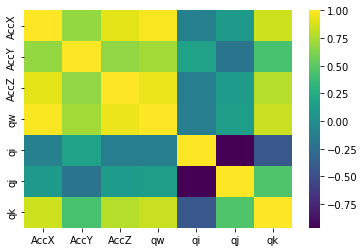

In [3]:
cs_corr = center_sternum[["AccX","AccY","AccZ","qw","qi","qj","qk"]].corr()
display(cs_corr)

sns.heatmap(cs_corr,cmap='viridis')

Moreover we don't take into consideration the magnetometer since we want based our prediction of the heart rate on the movements caused by the heart and we want to avoid to measure elettrical signal of the body that can cause more noise in our measurements.

In [4]:
center_sternum = center_sternum.iloc[:, 0:9]
center_sternum

,Log Mode,Log Freq,Timestamp,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,5,200,0,947.086,435.662,70.638,-6.824428,-14.244280,1.404580
1,5,200,0,969.168,387.777,88.877,6.183206,-12.290080,-7.969466
2,5,200,0,989.603,380.335,78.751,11.709920,-4.961832,-7.450382
3,5,200,0,954.894,418.033,88.328,17.877860,2.519084,-5.984733
4,5,200,0,972.096,427.732,99.857,25.221370,5.404580,4.015267
...,...,...,...,...,...,...,...,...,...
16501,5,200,75,958.493,291.092,-54.290,1.664122,2.305344,-0.671756
16502,5,200,75,954.650,288.042,-49.654,1.480916,2.488550,-0.702290
16503,5,200,75,967.338,290.482,-63.867,1.114504,3.374046,-0.900763
16504,5,200,75,965.630,300.852,-56.242,0.702290,3.664122,-1.587786


Since there ar groups of measurements with the the same value of the timestamp we compute the real period considering the total duration of the data and the total samples we have. In particular we obtain:<br>

$$
T = \frac{(t_{final} - t_{initial})}{N_{sample}}
$$
In the project we consider the timestamp in seconds. It makes sense given the fact that the maximum value is 75, too low to be consider as a fraction of second.

In [5]:
T = center_sternum["Timestamp"].max()/len(center_sternum.index)
frequency = 1/T
print("The period and the frequency of the data are: ", str(np.round(T,5))+"s",",",str(frequency)+"Hz","respectively")

The period and the frequency of the data are:  0.00454s , 220.08Hz respectively


With these information we can redefine the timestamp for each sample starting from zero and considering each sample taken every T seconds.

In [6]:
real_timestamp = np.zeros(len(center_sternum.index))
for i in range(1,len(center_sternum.index)):
    real_timestamp[i] = real_timestamp[i-1]+T

In [7]:
center_sternum["Timestamp"] = real_timestamp
center_sternum

,Log Mode,Log Freq,Timestamp,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,5,200,0.000000,947.086,435.662,70.638,-6.824428,-14.244280,1.404580
1,5,200,0.004544,969.168,387.777,88.877,6.183206,-12.290080,-7.969466
2,5,200,0.009088,989.603,380.335,78.751,11.709920,-4.961832,-7.450382
3,5,200,0.013631,954.894,418.033,88.328,17.877860,2.519084,-5.984733
4,5,200,0.018175,972.096,427.732,99.857,25.221370,5.404580,4.015267
...,...,...,...,...,...,...,...,...,...
16501,5,200,74.977281,958.493,291.092,-54.290,1.664122,2.305344,-0.671756
16502,5,200,74.981825,954.650,288.042,-49.654,1.480916,2.488550,-0.702290
16503,5,200,74.986369,967.338,290.482,-63.867,1.114504,3.374046,-0.900763
16504,5,200,74.990912,965.630,300.852,-56.242,0.702290,3.664122,-1.587786


### 1.1.1 Data offsetting with config file

Using the configuration data presented in config_1.txt, it's been possible to offset the values of accelerometer and gyroscope. In order to do so, the calibration matrix and the offset array given were applied to the original dataframe using a particular formula (see <b>References</b> [1])

<br>
$$ 
a^O = T^a*(a^S + b^a)
$$

where $T^a$ is the calibration matrix given by the dataset configuration, $a^S$ is the given data and $b^a$ is the offset vector. This formula referers to the accelerometer, for which a calibration matrix and an offset array were given. For the Gyroscope, only the offset array was presented in the configuration file, so the data was simply shifted accordingly.

In [8]:
def center_data(dataset, config_file):
    n = len(dataset.index)
    if config_file == 1:
        ### Setting calibration matrix and offset array for the accelerometer (from config_1.txt)
        Ta = [[1.000966, -0.002326418, -0.0006995499],
             [-0.002326379, 0.9787045, -0.001540918],
             [-0.0006995811, -0.001540928, 1.00403]]

        ba = np.array([-3.929942, -13.74679, 60.67546])
        
        ### Setting offset array for the gyroscope (no calibration matrix given)
        bg = [-2.242224, 2.963463, -0.718397]
        
    elif config_file == 5:
        ### Setting calibration matrix and offset array for the accelerometer (from config_5.txt)
        Ta = [[1.002982, 9.415505e-05, 0.004346743],
             [9.04459e-05, 1.002731, -0.001444198],
             [0.004346536, -0.001444751, 1.030587]]

        ba = np.array([3.602701, -20.96658, 54.97186])
        
        ### Setting offset array for the gyroscope (no calibration matrix given)
        bg = [-2.804399,1.793105, 0.3411708]
    
    As = np.array([dataset["AccX"].to_numpy(), dataset["AccY"].to_numpy(), dataset["AccZ"].to_numpy()])
    As_off = As + np.array([ba]*n).T
    Ao = np.matmul(Ta,As_off)


    Gs = np.array([dataset["GyroX"].to_numpy(), dataset["GyroY"].to_numpy(), dataset["GyroZ"].to_numpy()])
    Go = Gs + np.array([bg]*n).T

    centered_data = pd.DataFrame(Ao.T, columns = ["AccX","AccY","AccZ"])
    centered_data["GyroX"] = Go[0].T
    centered_data["GyroY"] = Go[1].T
    centered_data["GyroZ"] = Go[2].T

    display(centered_data)
    
    return centered_data

centered_data = center_data(center_sternum, config_file = 1)

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,942.993735,410.533833,130.532698,-9.066652,-11.280817,0.686183
1,965.195708,363.589092,148.903540,3.940982,-9.326617,-8.687863
2,985.674845,356.273637,138.733904,9.467696,-1.998369,-8.168779
3,950.837915,393.234828,148.315692,15.635636,5.482547,-6.703130
4,968.025903,402.669499,159.864174,22.979146,8.368043,3.296870
...,...,...,...,...,...,...
16501,954.835478,269.208490,5.316030,-0.578102,5.268807,-1.390153
16502,950.992618,266.225238,9.978102,-0.761308,5.452013,-1.420687
16503,963.697141,268.605661,-4.304813,-1.127720,6.337509,-1.619160
16504,961.958032,278.747051,3.336131,-1.539934,6.627585,-2.306183


### 1.1.2 Plotting of the data

In order to select the correct window, we need to display the data.

In [9]:
def plotColumn(windows, timeline, left_limit, right_limit, ax, data, ylabel,pos = "upper center", zoom = 6.5, ylim =200):
    ax.plot(timeline,data)
    ax.set_ylim([data.min(),ylim+data.max()])
    ax.set_ylabel(ylabel,fontsize=15)
    ax.set_xlabel("time",fontsize=15)
    ax.set_xlim([0,timeline[-1]])
    ax.title.set_text(ylabel)
    
    axins = zoomed_inset_axes(ax,zoom,loc = pos, axes_kwargs={"facecolor" : "lightgray"})
    axins.plot(timeline,data)
    
    y1 = data.iloc[windows].min()
    y2 = data.iloc[windows].max()

    axins.set_xlim(left_limit,right_limit)
    axins.set_ylim(y1,y2)
    
    l1,l2 = 3,4
    if(pos == 'center'):
        l1,l2 = 1,2
    pp,_,_ = mark_inset(ax,axins,loc1=l1,loc2=l2)
    pp.set_fill(True)
    pp.set_facecolor("lightgray")
    pp.set_edgecolor("k")

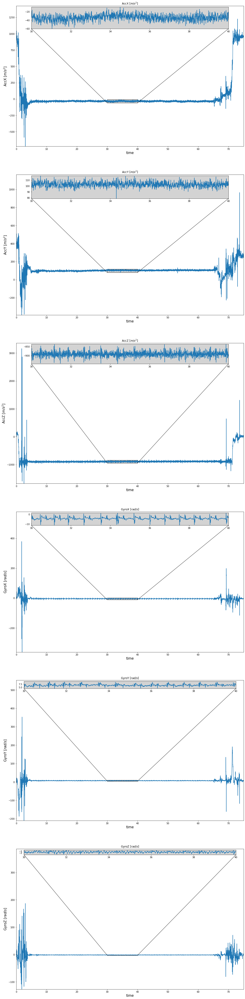

In [10]:
left_limit,right_limit = 30,40
window = np.where((real_timestamp >= left_limit) & (real_timestamp <= right_limit))

fig, ax = plt.subplots(6, 1,figsize=(18,80))
plotColumn(window,real_timestamp,left_limit, right_limit, ax[0],centered_data["AccX"], "AccX [$m/s^2$]")
plotColumn(window,real_timestamp,left_limit, right_limit, ax[1],centered_data["AccY"], "AccY [$m/s^2$]")
plotColumn(window,real_timestamp,left_limit, right_limit, ax[2],centered_data["AccZ"], "AccZ [$m/s^2$]")
plotColumn(window,real_timestamp,left_limit, right_limit, ax[3],centered_data["GyroX"], "GyroX [$rad/s$]")
plotColumn(window,real_timestamp,left_limit, right_limit, ax[4],centered_data["GyroY"], "GyroY [$rad/s$]", zoom = 7)
plotColumn(window,real_timestamp,left_limit, right_limit, ax[5],centered_data["GyroZ"], "GyroZ [$rad/s$]", zoom = 7)
plt.show()

Given the plot of the data, it's easy to see that a good value of the windows is in the range 5s and 65s. The high noise at the begining and and the end of the plot can be caused by the movement of the patient that was still moving and setting up for the experiment.

In [11]:
t1,t2 = 5,65

filter_data = np.where((real_timestamp >= t1) & (real_timestamp <= t2))

center_sternum_window = centered_data.iloc[filter_data]
display(center_sternum_window)

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
1101,-43.876698,91.620509,-906.078880,2.673806,7.665753,-1.619160
1102,-44.044500,93.995331,-936.092875,-1.158255,6.993997,-1.481756
1103,-43.745159,92.601196,-922.861827,-8.043751,6.673387,-2.153512
1104,-32.287104,95.048777,-901.254020,-9.952148,5.940562,-1.771832
1105,-46.401790,91.938663,-876.189730,-9.280392,4.490181,-1.069542
...,...,...,...,...,...,...
14301,-40.429875,100.180504,-887.292378,-5.112453,6.413845,-2.000840
14302,-37.434161,100.241993,-892.990426,-5.234590,6.368043,-2.077176
14303,-43.805016,104.952167,-879.335593,-4.944514,6.627585,-2.031374
14304,-42.217843,104.467580,-877.192347,-4.990316,6.932929,-2.199313


## 1.2 Statistical analysis

Here some statistical measurements were computed in order to find the most informative values and the relation between them.

<b>Mean

In [12]:
cs_mean = center_sternum_window.mean(axis=0)
print(cs_mean.to_string())

AccX     -34.465302
AccY     100.767049
AccZ    -892.512822
GyroX     -4.331465
GyroY      6.653141
GyroZ     -1.580475


<b>Median

In [13]:
cs_median =  center_sternum_window.median(axis=0)
print(cs_median.to_string())

AccX     -34.393065
AccY     101.080099
AccZ    -892.872695
GyroX     -4.394896
GyroY      6.597051
GyroZ     -1.573359


<b>Variance

In [14]:
cs_var =  center_sternum_window.var(axis=0)
print(cs_var.to_string())

AccX      51.277767
AccY      32.077823
AccZ     216.022367
GyroX      2.137008
GyroY      0.548365
GyroZ      0.163592


<b>Standard deviation

In [15]:
cs_std = center_sternum_window.std(axis=0)
print(cs_std.to_string())

AccX      7.160850
AccY      5.663729
AccZ     14.697699
GyroX     1.461851
GyroY     0.740516
GyroZ     0.404466


<b>25th percentile

In [16]:
cs_p25 = center_sternum_window.quantile(0.25)
print(cs_p25.to_string())

AccX     -39.094512
AccY      97.267067
AccZ    -901.383711
GyroX     -4.944514
GyroY      6.230639
GyroZ     -1.832901


<b>75th percentile

In [17]:
cs_p75 = center_sternum_window.quantile(0.75)
print(cs_p75.to_string())

AccX     -29.682668
AccY     104.505738
AccZ    -884.419541
GyroX     -3.692606
GyroY      6.978730
GyroZ     -1.329084


Considering all this statistical measures, for us the most relevant is the standard deviation that underlines that only two of this measures (AccX and AccZ) have some relevant variation w.r.t. the mean value. This could mean that only one or two of the columns countains the relevant information to extract the heart rate.<br>
The low variance of the data could be investicated considering the correlation between the columns.

<b>Correlation

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
AccX,1.000000,-0.167563,-0.399266,0.213460,0.005322,0.019669
AccY,-0.167563,1.000000,0.189784,-0.048713,-0.012306,-0.127133
AccZ,-0.399266,0.189784,1.000000,-0.079947,0.102217,0.011254
GyroX,0.213460,-0.048713,-0.079947,1.000000,0.400042,0.334154
GyroY,0.005322,-0.012306,0.102217,0.400042,1.000000,0.414976
GyroZ,0.019669,-0.127133,0.011254,0.334154,0.414976,1.000000


<AxesSubplot:>

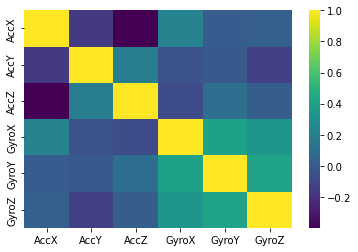

In [18]:
cs_corr = center_sternum_window.corr()
display(cs_corr)

sns.heatmap(cs_corr,cmap='viridis')

The corelation matrix presents very few relavant values, in particular, considering the highest value found:
<ul>
    <li> <b>Positive correlation</b> of 0.41 between GyroY and GyroZ;</li>
    <li> <b>Negative correlation</b> of about -0.40 between AccZ and AccX</li>
</ul>

This confirm the analisis on the standard deviation on the data and permits to conclude that make sense to consider to reduce our data using the PCA.

## 1.3 PCA of the data

In [19]:
X = center_sternum_window.values
n = len(center_sternum_window.index)
U, S, Vt = np.linalg.svd(X.T)
l_svd = S**2/(n-1)
V_svd = U

print("SVD:\n", l_svd)

SVD:
 [8.08254474e+05 6.17197269e+01 3.09731559e+01 2.17450444e+00
 4.70754814e-01 1.22877735e-01]


In [20]:
tot = 0
for i in range(len(l_svd)):
    tot += l_svd[i]

variability = (l_svd[0])/tot

print("If we retain only one component we mantain a total variability of:",str(np.round(variability*100,2))+"%")

If we retain only one component we mantain a total variability of: 99.99%


In [21]:
X_reduced = np.dot(V_svd[:,0].T,X.T)

In [22]:
new_dataset = pd.DataFrame(data = X_reduced, columns = ["Feature 1"])
new_dataset

,Feature 1
0,911.659929
1,941.747300
2,928.474169
3,906.857989
4,882.147735
...,...
13200,893.862553
13201,899.412860
13202,886.626830
13203,884.386460


Notice that, even if the PCA permits to reduce a lot our features set, it introduces noise. This can be verify looking at the plot of the signal.

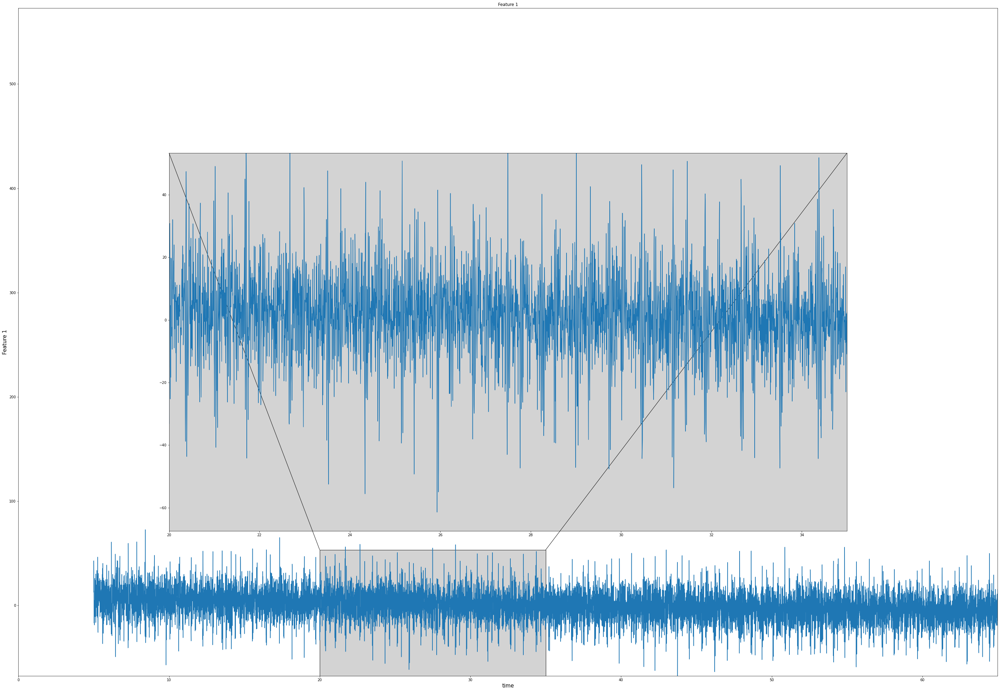

In [23]:
fig, ax = plt.subplots(1, 1,figsize=(50,35))
plotColumn(window ,real_timestamp[filter_data],20, 35, ax,new_dataset["Feature 1"]-new_dataset["Feature 1"].mean(), "Feature 1",pos = "center",zoom =3,ylim=500)

## 1.4 Fourier analysis

In order to find the relevant frequency, the Fourier transofrm must be applied to our reduced dataset. In particular, according to <b>References</b> [2], we need to filter our signal in range 0.7-3Hz that is the range of the heart rate.

In [24]:
def compute_fft(dataset,range_ = [-np.inf,np.inf], period = 0.1):
    
    x1,x2 = range_[0],range_[1]
    dataset -= dataset.mean()
    #fft
    fft_dataset = fftpack.fft(dataset)
    power_dataset = np.abs(fft_dataset)
    fft_freq = fftpack.fftfreq(len(dataset), d=T)
    
    #pass-band filter
    filter_ = (np.abs(fft_freq)>=x1) & (np.abs(fft_freq) <=x2)
    
    return fft_dataset, fft_freq, power_dataset, filter_

    
def fft_plot(x1,x2,fft_freq,power_dataset, title):
    
    fig, ax = plt.subplots(1,2, figsize=(20,10))
    ax[0].plot(fft_freq,power_dataset)
    ax[0].set(xlabel="frequency", ylabel="power",title=title)
    
    interval = np.where((fft_freq>=x1) & (fft_freq <=x2))
    ax[1].plot(fft_freq[interval],power_dataset[interval])
    ax[1].set(xlabel="frequency", ylabel="power",title = title + "(zoomed)")
    return ax

The peak frequency is:  2.749958349110186Hz
This corresponds to a bpm of: 165.0


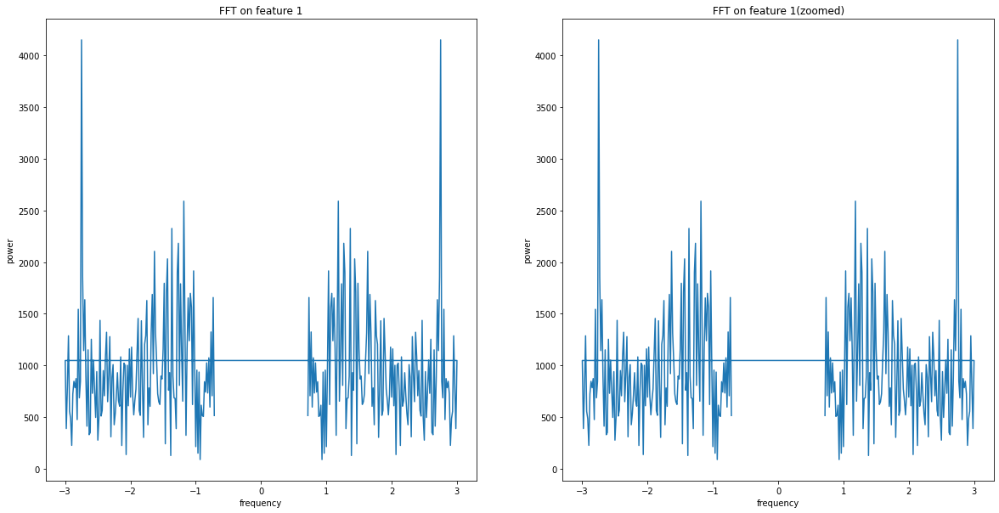

In [25]:
fft_sig, fft_freq, power,filter_ = compute_fft(X_reduced,[0.7,3],T)
ax = fft_plot(-3, 3, fft_freq[filter_], power[filter_], "FFT on feature 1")

print("The peak frequency is: ",str(fft_freq[filter_][power[filter_].argmax()])+"Hz" )
print("This corresponds to a bpm of:",np.round(fft_freq[filter_][power[filter_].argmax()]*60,2))

Notice the pick corresponding to the peak frequencies is quite strange: the power is very high w.r.t. the other frequecies and the value of the frequency is not compatible with the situation. This could mean that in our measure there is some noisy data, or, even better, this is cause by the noise added by the PCA. So another filter must be imposed on the power. <br>
We consider the classical cofidence interval of a gaussian random variable, i.e., mean + 3 times the standard deviation. The plot of the gaussian distribution somehow confirms this fact since the tail of the curve is refered to the power of the peak frequency of our filtered signal.

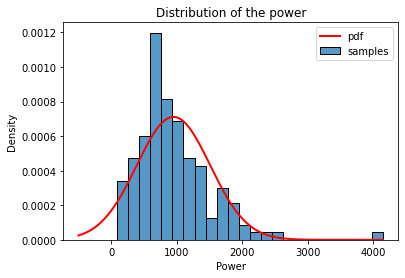

In [26]:
p = sns.histplot(power[filter_], stat = 'density', label = 'samples')
p.set_title("Distribution of the power")
p.set_xlabel("Power")
x_pdf = np.linspace(-500, power[filter_].max(), 1000)
y_pdf = scipy.stats.norm.pdf(x_pdf,loc = power[filter_].mean(), scale = power[filter_].std())
p.plot(x_pdf,y_pdf, 'r', lw = 2, label = 'pdf')
p.legend()
plt.show()

The combination of the two filters permits to find the frequency of the heart rate. What is left to do now is to analys the final metrics in the time domain.

The peak frequency is:  1.1833Hz
This corresponds to a bpm of: 71.0


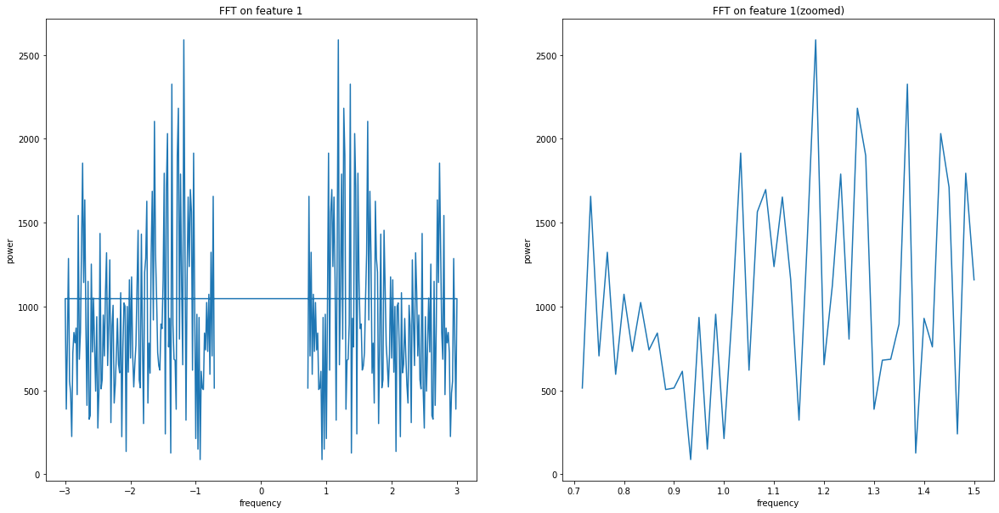

In [27]:
mean_power = power[filter_].mean()
std_power= np.std(power[filter_])

mask = (np.abs(power)<= (mean_power+3*std_power)) & (np.abs(power) >= (mean_power-3*std_power))
mask = mask & filter_
fft_freq_filtered =fft_freq[mask]
power_filtered = power[mask]

peak_freq = fft_freq_filtered[power_filtered.argmax()]
ax = fft_plot(0, 1.5, fft_freq_filtered, power_filtered, "FFT on feature 1")

print("The peak frequency is: ",str(np.round(peak_freq,4))+"Hz")
print("This corresponds to a bpm of:",str(np.round(peak_freq*60,2)))

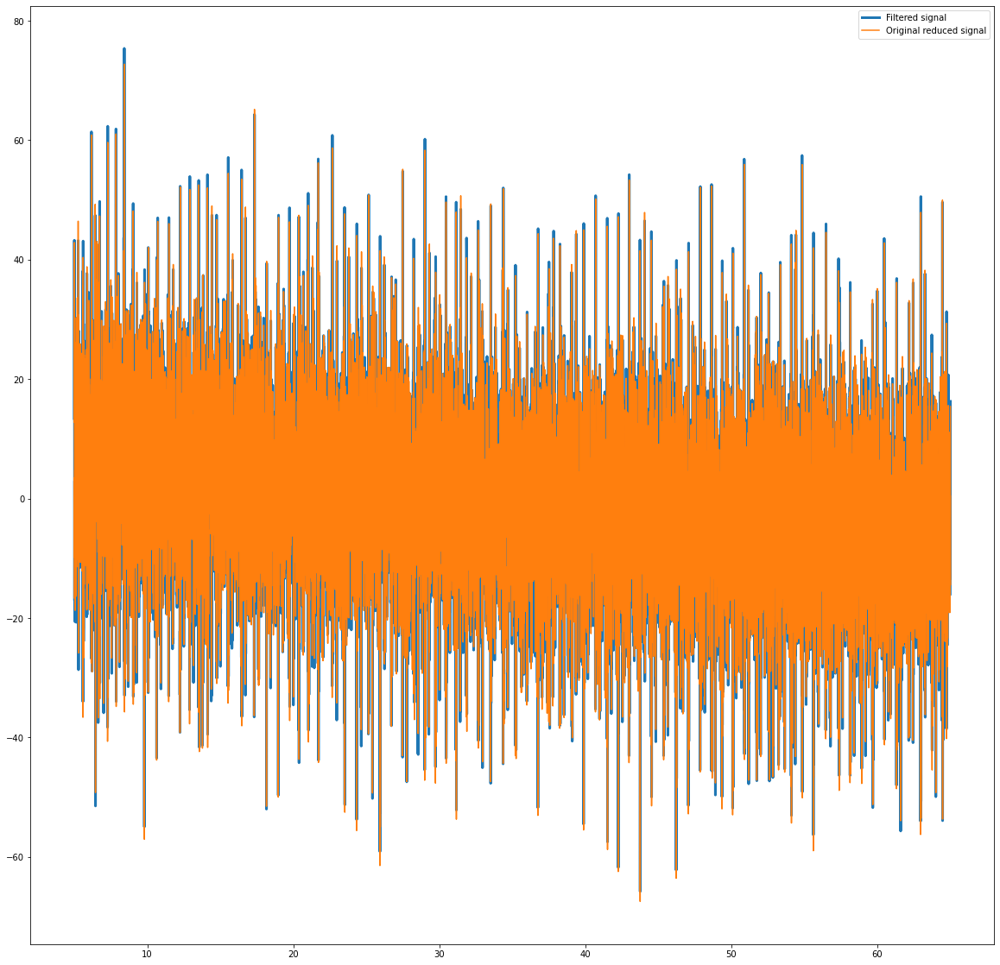

In [28]:
final_mask = mask
fft_sig_copy = fft_sig.copy()
fft_sig_copy[final_mask]=0
filtered_sig = fftpack.ifft(fft_sig_copy)
filtered_sig = np.real(filtered_sig)

plt.figure(figsize=(20, 20))

plt.plot(real_timestamp[filter_data], filtered_sig, linewidth=3, label='Filtered signal')
plt.plot(real_timestamp[filter_data],new_dataset["Feature 1"] , label='Original reduced signal')
plt.legend()

Notice that the inverse transoform of the filtered signal does not change too much the original signal. This implies that a better filter must be applied on our data, in particular we want to retain all the frequencies near the peak frequency discovered during the analisis.

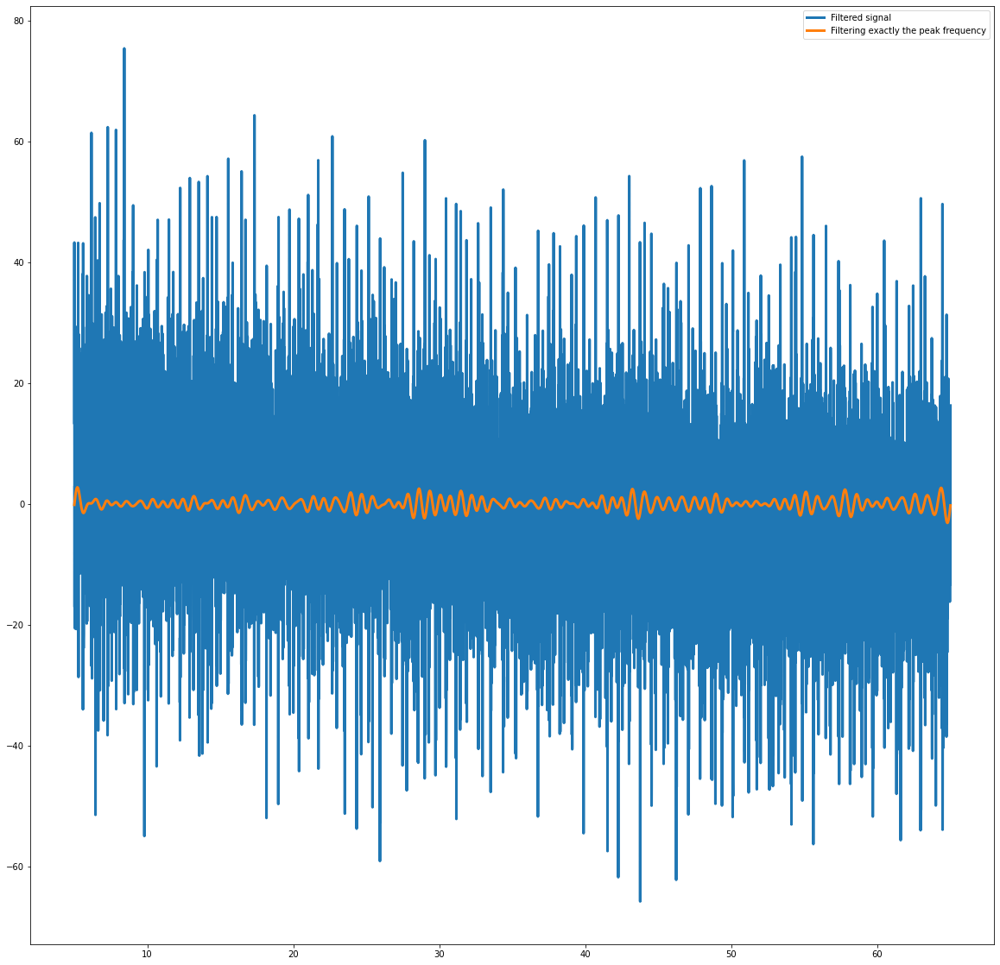

In [29]:
final_mask = (np.abs(np.abs(fft_freq) - peak_freq)>= 0.4)
fft_sig[final_mask]=0
filtered_sig2 = fftpack.ifft(fft_sig)
filtered_sig2 = np.real(filtered_sig2)

plt.figure(figsize=(20, 20))

plt.plot(real_timestamp[filter_data], filtered_sig, linewidth=3, label='Filtered signal')
plt.plot(real_timestamp[filter_data],filtered_sig2 , label='Filtering exactly the peak frequency',linewidth=3)
plt.legend()

## 1.5 Heart rate and Heart rate variability
Now we need to compute the position of the minima to determine where the peaks are to compute the number of beats and the mean heart rate variability in the dataset.

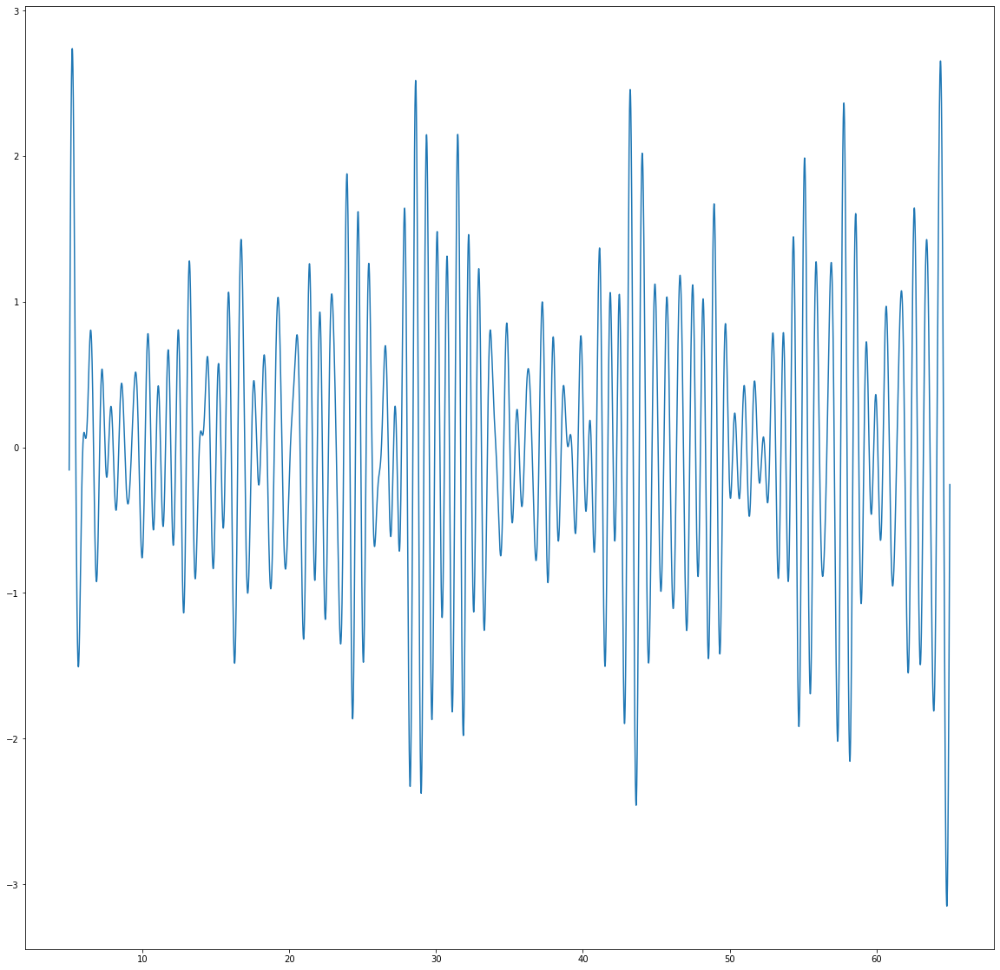

In [30]:
plt.figure(figsize=(20, 20))
plt.plot(real_timestamp[filter_data],filtered_sig2 , label='Filtering exactly the peak frequency')

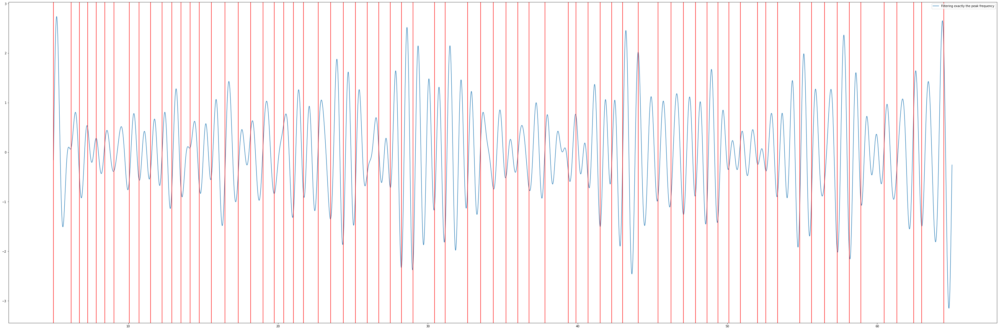

In [31]:
plt.figure(figsize=(60, 20))
plt.plot(real_timestamp[filter_data],filtered_sig2 , label='Filtering exactly the peak frequency')
idx_minima = signal.argrelextrema(filtered_sig, np.greater, order = 110)

for i in idx_minima[0]:
    plt.axvline(real_timestamp[filter_data][i], color = 'r')
plt.legend()

Duration of the dataset (excluding start-end noise): 60 seconds
Beats in these 60 seconds:  71


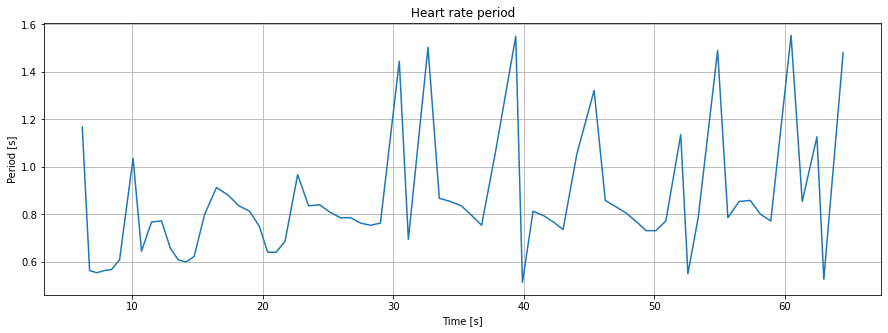

In [32]:
total_beats = len(idx_minima[0])

print('Duration of the dataset (excluding start-end noise): 60 seconds')
print('Beats in these 60 seconds: ',total_beats)

intervals = []

for i in idx_minima[0]:
    intervals.append(real_timestamp[filter_data][i])
    
periods_diff = []

for i in range(1,len(intervals)):
    periods_diff.append(intervals[i]-intervals[i-1])
        
#plot the period vs time
plt.figure(figsize=(15,5))
plt.plot(intervals[1:], periods_diff)
plt.title("Heart rate period")
plt.xlabel('Time [s]')
plt.ylabel('Period [s]')
plt.grid()
plt.show()

Mean HRV (intended as period variability) calculated on whole dataset: 0.22 s


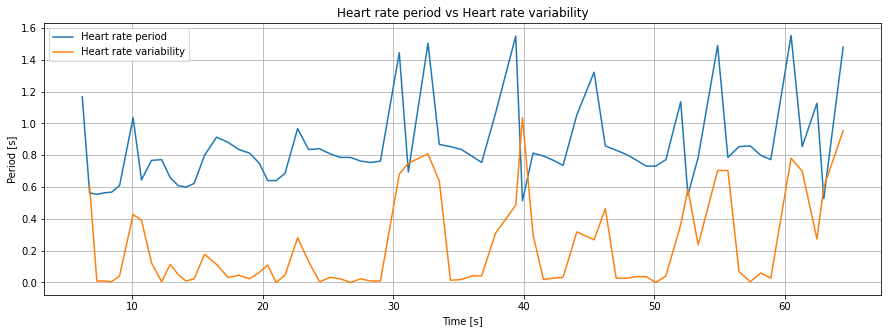

In [33]:
#plot the period variability vs time
periods_diff_diff = []
for i in range(1,len(periods_diff)):
    periods_diff_diff.append(abs(periods_diff[i]-periods_diff[i-1]))
        
mean_brv = np.mean(periods_diff_diff) 
print("Mean HRV (intended as period variability) calculated on whole dataset:", round(mean_brv,2), "s")

plt.figure(figsize=(15,5))
plt.plot(intervals[1:],periods_diff,label='Heart rate period')
plt.title("Heart rate period vs Heart rate variability")
plt.plot(intervals[2:],periods_diff_diff,label='Heart rate variability')
plt.xlabel('Time [s]')
plt.ylabel('Period [s]')
plt.grid()
plt.legend()
plt.show()

## 1.6 Kernel density estimation of the BPM

We can now compute the "instant" BPM for each beat considering the following formula:
$$
BPM_{instant} = \frac{1}{t_{i} - t_{i-1}}\cdot60
$$

In [34]:
bpm_instant = [(1/i)*60 for i in periods_diff]

In order to select the correct number of bins the **Sturge’s Rule** was used:
$$
K = 1+3.322\log(n)
$$
Where $K$ is the number of bins and $n$ is the number of samples.

The number of bins used is: 7


Text(0.5, 1.0, 'BPM distribution on the collected data')

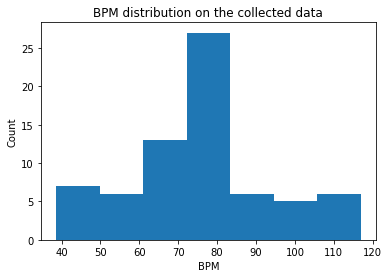

In [35]:
n = len(bpm_instant)
bins = int(1 + 3.322*mt.log(n,10))
print("The number of bins used is:",bins)
plt.hist(bpm_instant,bins = bins);
plt.xlabel("BPM")
plt.ylabel("Count")
plt.title("BPM distribution on the collected data")

To characterize the distribution of the heart rate, kernel density estimation is perfomed on the data. In particoular the implementation provided by Scikit-Learn library was used using a gaussian kernel. The bandwitdth of the filter, according to the literature must be $O(n^{-\frac{1}{5}})$, in particular for the gaussian kernel a good choice is:
$$
h = 1.06\sigma n^{-\frac{1}{5}}
$$
Where $\sigma$ is the standard deviation of the data and $n$ the number of samples.

In [36]:
h = 1.06*np.std(bpm_instant)*n**(-0.2)
kde = KernelDensity(bandwidth= h, kernel='gaussian')
kde.fit(np.sort(np.array(bpm_instant)).reshape(-1,1))
score = kde.score_samples(np.sort(np.array(bpm_instant)).reshape(-1,1))

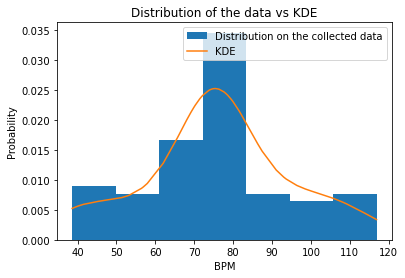

In [37]:
plt.hist(bpm_instant,bins = bins,density=True,label="Distribution on the collected data");
plt.plot(np.sort(np.array(bpm_instant)).reshape(-1,1),np.exp(score), label = "KDE")
plt.xlabel("BPM")
plt.ylabel("Probability")
plt.title("Distribution of the data vs KDE")
plt.legend()


# 2 Under chair analysis

As last part of this project, the same analysis is implemented using a different dataset. This is was done only for comparison using the same features of the previous section, even if the different position of the sensor maybe required some different set of features to be keep into account.

## 2.1 Reading of the data


In [38]:
#reading the file
file_name = "data/5_Under_chair.txt"
under_chair = pd.read_csv(file_name, delimiter="\t")

#starting from zero as first measure
under_chair["Timestamp"] = under_chair["Timestamp"]-under_chair["Timestamp"].min()

display(under_chair)

,Log Mode,Log Freq,Timestamp,AccX,AccY,AccZ,GyroX,GyroY,GyroZ,MagnX,MagnY,MagnZ,qw,qi,qj,qk
0,5,100,0,8.357,-38.369,1028.094,-2.804878,1.585366,0.243902,-155,29,-227,0.780042,-0.008728,0.002716,-0.625660
1,5,100,0,-368.928,-44.408,-853.329,30.121950,21.219510,26.219510,-267,134,624,0.390698,0.294320,0.869625,-0.066958
2,5,100,0,-359.717,-52.216,-867.176,-2.804878,1.585366,-0.121951,-267,133,624,0.218179,0.311960,0.921964,-0.071139
3,5,100,0,-372.771,-52.704,-873.215,-2.804878,1.707317,0.243902,-268,134,622,0.198960,0.313273,0.925840,-0.071383
4,5,100,0,-370.209,-48.434,-852.841,-2.560976,1.585366,0.243902,-266,133,621,0.191172,0.313761,0.927305,-0.071505
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9907,5,100,713,-360.754,-48.678,-857.111,-3.414634,-0.487805,0.243902,-243,129,627,0.150588,0.537950,0.821619,-0.113468
9908,5,100,713,-361.059,-54.778,-851.743,-3.048780,0.243902,-0.121951,-243,129,627,0.150335,0.538408,0.821345,-0.113620
9909,5,100,713,-303.048,-53.009,-815.570,-2.682927,1.097561,0.243902,-243,130,628,0.165176,0.532487,0.822504,-0.112522
9910,5,100,713,-369.233,-50.142,-860.344,-2.926829,0.365854,0.609756,-245,130,627,0.161020,0.537980,0.819636,-0.113346


,AccX,AccY,AccZ,qw,qi,qj,qk
AccX,1.000000,-0.395532,0.499845,-0.135997,0.128724,-0.241953,-0.271603
AccY,-0.395532,1.000000,-0.146547,0.112168,0.115280,-0.089710,0.081896
AccZ,0.499845,-0.146547,1.000000,0.408344,-0.098915,-0.199442,-0.340962
qw,-0.135997,0.112168,0.408344,1.000000,-0.621818,0.272907,0.079697
qi,0.128724,0.115280,-0.098915,-0.621818,1.000000,-0.876808,-0.650291
qj,-0.241953,-0.089710,-0.199442,0.272907,-0.876808,1.000000,0.902236
qk,-0.271603,0.081896,-0.340962,0.079697,-0.650291,0.902236,1.000000


<AxesSubplot:>

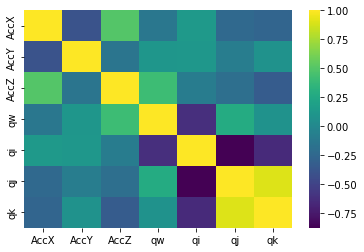

In [39]:
uc_corr = under_chair[["AccX","AccY","AccZ","qw","qi","qj","qk"]].corr()
display(uc_corr)

sns.heatmap(uc_corr,cmap='viridis')

Infact, looking ath the correlation between the accelerometer and the quaternions, in this case the data are uncorrelate. As said before, we mantain the same data used for the previous dataset for the comparison.

In [40]:
under_chair = under_chair.iloc[:, 0:9]
under_chair

,Log Mode,Log Freq,Timestamp,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,5,100,0,8.357,-38.369,1028.094,-2.804878,1.585366,0.243902
1,5,100,0,-368.928,-44.408,-853.329,30.121950,21.219510,26.219510
2,5,100,0,-359.717,-52.216,-867.176,-2.804878,1.585366,-0.121951
3,5,100,0,-372.771,-52.704,-873.215,-2.804878,1.707317,0.243902
4,5,100,0,-370.209,-48.434,-852.841,-2.560976,1.585366,0.243902
...,...,...,...,...,...,...,...,...,...
9907,5,100,713,-360.754,-48.678,-857.111,-3.414634,-0.487805,0.243902
9908,5,100,713,-361.059,-54.778,-851.743,-3.048780,0.243902,-0.121951
9909,5,100,713,-303.048,-53.009,-815.570,-2.682927,1.097561,0.243902
9910,5,100,713,-369.233,-50.142,-860.344,-2.926829,0.365854,0.609756


In [41]:
T = under_chair["Timestamp"].max()/len(under_chair.index)
frequency = 1/T
print("The period and the frequency of the data are: ", str(np.round(T,5))+"s",",",str(frequency)+"Hz","respectively")

The period and the frequency of the data are:  0.07193s , 13.901823281907433Hz respectively


In [42]:
real_timestamp = np.zeros(len(under_chair.index))
for i in range(1,len(under_chair.index)):
    real_timestamp[i] = real_timestamp[i-1]+T

In [43]:
under_chair["Timestamp"] = real_timestamp
under_chair

,Log Mode,Log Freq,Timestamp,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,5,100,0.000000,8.357,-38.369,1028.094,-2.804878,1.585366,0.243902
1,5,100,0.071933,-368.928,-44.408,-853.329,30.121950,21.219510,26.219510
2,5,100,0.143866,-359.717,-52.216,-867.176,-2.804878,1.585366,-0.121951
3,5,100,0.215799,-372.771,-52.704,-873.215,-2.804878,1.707317,0.243902
4,5,100,0.287732,-370.209,-48.434,-852.841,-2.560976,1.585366,0.243902
...,...,...,...,...,...,...,...,...,...
9907,5,100,712.640335,-360.754,-48.678,-857.111,-3.414634,-0.487805,0.243902
9908,5,100,712.712268,-361.059,-54.778,-851.743,-3.048780,0.243902,-0.121951
9909,5,100,712.784201,-303.048,-53.009,-815.570,-2.682927,1.097561,0.243902
9910,5,100,712.856134,-369.233,-50.142,-860.344,-2.926829,0.365854,0.609756


### 2.1.1 Data offsetting with config file

In [44]:
centered_data = center_data(under_chair, config_file = 5)

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
0,16.697587,-61.060705,1116.331304,-5.609277,3.378471,0.585073
1,-369.891108,-64.433174,-824.269939,27.317551,23.012615,26.560681
2,-360.713565,-72.241667,-838.489161,-5.609277,3.378471,0.219220
3,-373.832788,-72.723459,-844.768911,-5.609277,3.500422,0.585073
4,-371.174185,-68.470990,-823.766764,-5.365375,3.378471,0.585073
...,...,...,...,...,...,...
9907,-361.709574,-68.708634,-828.125922,-6.219033,1.305300,0.585073
9908,-361.992725,-74.833074,-822.586243,-5.853179,2.037007,0.219220
9909,-303.651335,-73.106237,-785.057229,-5.487326,2.890666,0.585073
9910,-370.228049,-70.172730,-831.492549,-5.731228,2.158959,0.950927


### 1.1.2 Plotting of the data

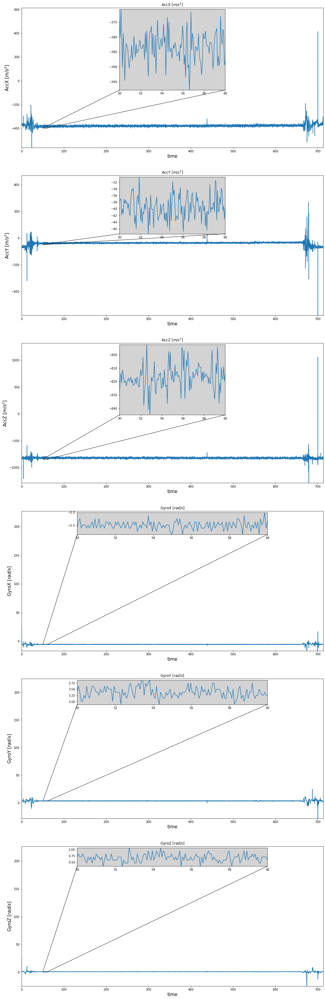

In [75]:
left_limit,right_limit = 50,60
window = np.where((real_timestamp >= left_limit) & (real_timestamp <= right_limit))

fig, ax = plt.subplots(6, 1,figsize=(18,60))
plotColumn(window,real_timestamp,left_limit, right_limit, ax[0],centered_data["AccX"], "AccX [$m/s^2$]",zoom = 25)
plotColumn(window,real_timestamp,left_limit, right_limit, ax[1],centered_data["AccY"], "AccY [$m/s^2$]",zoom = 25)
plotColumn(window,real_timestamp,left_limit, right_limit, ax[2],centered_data["AccZ"], "AccZ [$m/s^2$]",zoom = 25)
plotColumn(window,real_timestamp,left_limit, right_limit, ax[3],centered_data["GyroX"], "GyroX [$rad/s$]",zoom = 45)
plotColumn(window,real_timestamp,left_limit, right_limit, ax[4],centered_data["GyroY"], "GyroY [$rad/s$]",zoom = 45)
plotColumn(window,real_timestamp,left_limit, right_limit, ax[5],centered_data["GyroZ"], "GyroZ [$rad/s$]",zoom = 45)
plt.show()

The longer time measurements permits to used a larger window,in particular we used a windows of 5 minutes.

In [46]:
t1,t2 = 100,400

filter_data = np.where((real_timestamp >= t1) & (real_timestamp <= t2))

under_chair_window = centered_data.iloc[filter_data]
display(under_chair_window)

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
1391,-381.765362,-41.066228,-826.052419,-5.609277,3.378471,0.707024
1392,-389.731709,-38.697488,-814.649012,-5.243423,3.500422,0.585073
1393,-386.505477,-44.013403,-818.399241,-5.487326,3.378471,0.707024
1394,-383.038758,-38.011715,-823.422029,-5.365375,3.256520,0.585073
1395,-382.714544,-32.267930,-819.216979,-5.731228,3.378471,0.828976
...,...,...,...,...,...,...
5556,-378.645609,-37.436498,-840.754430,-5.243423,3.378471,0.828976
5557,-374.520998,-32.122916,-834.834947,-5.609277,3.500422,0.828976
5558,-374.898004,-37.543149,-808.048479,-5.487326,3.134568,0.707024
5559,-381.668926,-41.200273,-817.690825,-5.365375,3.500422,0.585073


## 2.2 Statistical analysis

<b> Mean

In [47]:
uc_mean = under_chair_window.mean(axis=0)
print(uc_mean.to_string())

AccX    -380.172861
AccY     -36.956431
AccZ    -820.060104
GyroX     -5.465334
GyroY      3.366802
GyroZ      0.660993


<b> Median

In [48]:
uc_median = under_chair_window.median(axis=0)
print(uc_mean.to_string())

AccX    -380.172861
AccY     -36.956431
AccZ    -820.060104
GyroX     -5.465334
GyroY      3.366802
GyroZ      0.660993


<b> Variance

In [49]:
uc_var = under_chair_window.var(axis=0)
print(uc_var.to_string())

AccX      27.540874
AccY       9.433851
AccZ     101.597768
GyroX      0.025386
GyroY      0.057344
GyroZ      0.022966


<b> Standard deviation

In [50]:
uc_std = under_chair_window.std(axis=0)
print(uc_std.to_string())

AccX      5.247940
AccY      3.071458
AccZ     10.079572
GyroX     0.159331
GyroY     0.239466
GyroZ     0.151545


<b> 25th percentile

In [51]:
uc_p25 = under_chair_window.quantile(0.25)
print(uc_p25.to_string())

AccX    -383.563462
AccY     -39.041866
AccZ    -825.179498
GyroX     -5.609277
GyroY      3.256520
GyroZ      0.585073


<b> 75th percentile

In [52]:
uc_p75 = under_chair_window.quantile(0.75)
print(uc_p75.to_string())

AccX    -376.701938
AccY     -34.912818
AccZ    -814.768110
GyroX     -5.365375
GyroY      3.500422
GyroZ      0.707024


<b> Correlation 

,AccX,AccY,AccZ,GyroX,GyroY,GyroZ
AccX,1.000000,0.071868,-0.000613,-0.030379,0.002150,-0.015073
AccY,0.071868,1.000000,0.124225,0.021525,0.024177,0.015031
AccZ,-0.000613,0.124225,1.000000,0.013331,-0.006263,-0.015042
GyroX,-0.030379,0.021525,0.013331,1.000000,-0.003838,-0.023661
GyroY,0.002150,0.024177,-0.006263,-0.003838,1.000000,0.013211
GyroZ,-0.015073,0.015031,-0.015042,-0.023661,0.013211,1.000000


<AxesSubplot:>

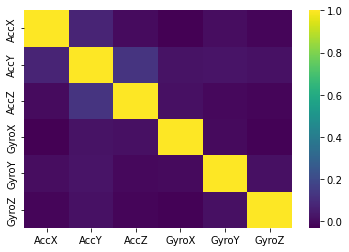

In [53]:
uc_corr = under_chair_window.corr()
display(uc_corr)

sns.heatmap(uc_corr,cmap='viridis')

For this dataset the features are high incorrelated.

## 2.3 PCA of the data

In [54]:
X = under_chair_window.values
n = len(under_chair_window.index)
U, S, Vt = np.linalg.svd(X.T)
l_svd = S**2/(n-1)
V_svd = U

print("SVD:\n", l_svd)

SVD:
 [8.18722375e+05 4.06769529e+01 9.23016375e+00 5.83055659e-02
 2.80337649e-02 2.28500049e-02]


In [55]:
tot = 0
for i in range(len(l_svd)):
    tot += l_svd[i]

variability = (l_svd[0])/tot

print("If we retain only one component we mantain a total variability of:",str(np.round(variability*100,2))+"%")

If we retain only one component we mantain a total variability of: 99.99%


In [56]:
X_reduced = np.dot(V_svd[:,0].T,X.T)

In [57]:
new_dataset = pd.DataFrame(data = X_reduced, columns = ["Feature 1"])
new_dataset

,Feature 1
0,910.945240
1,903.857087
2,906.119216
3,908.969119
4,904.789276
...,...
4165,922.811050
4166,915.497572
4167,891.593736
4168,903.329438


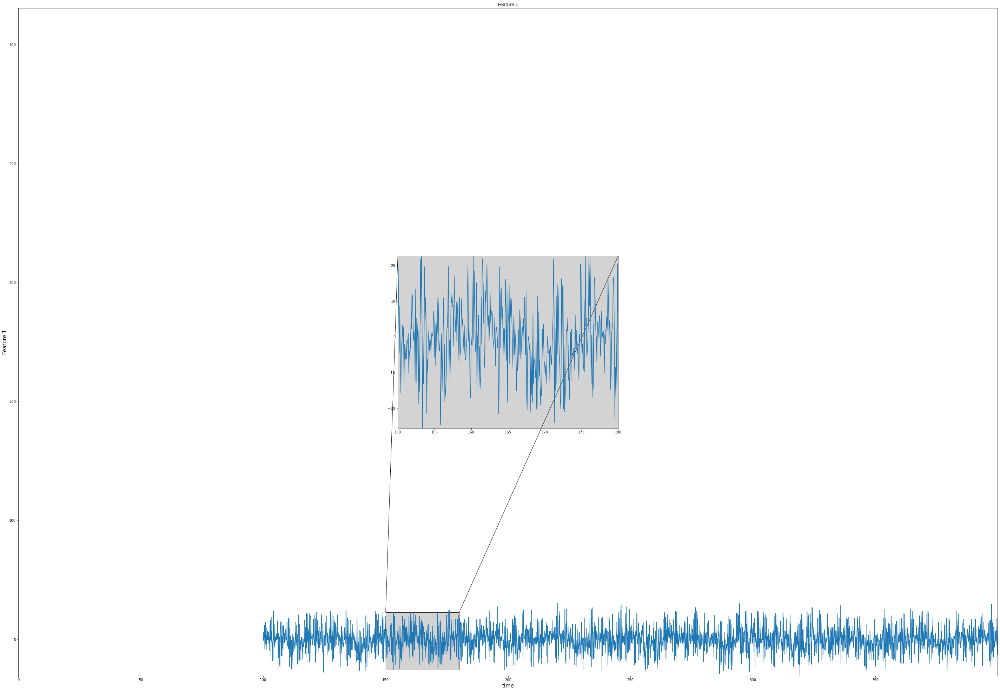

In [58]:
fig, ax = plt.subplots(1, 1,figsize=(50,35))
plotColumn(window ,real_timestamp[filter_data],150, 180, ax,new_dataset["Feature 1"]-new_dataset["Feature 1"].mean(), "Feature 1",pos = "center",zoom =3,ylim=500)

## 2.4 Fourier analysis

The peak frequency is:  1.7068905324548216Hz
This corresponds to a bpm of: 102.41


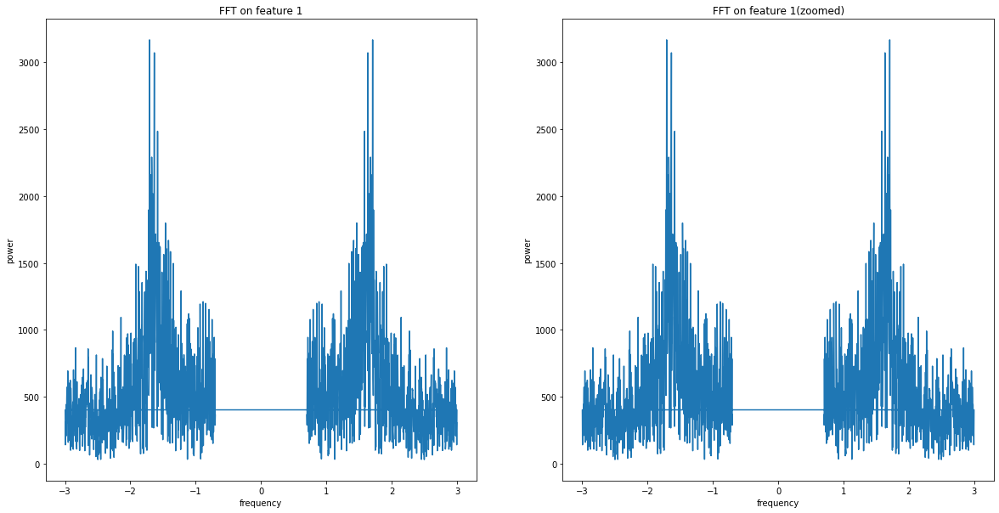

In [59]:
fft_sig, fft_freq, power,filter_ = compute_fft(X_reduced,[0.7,3],T)
ax = fft_plot(-3, 3, fft_freq[filter_], power[filter_], "FFT on feature 1")

print("The peak frequency is: ",str(fft_freq[filter_][power[filter_].argmax()])+"Hz" )
print("This corresponds to a bpm of:",np.round(fft_freq[filter_][power[filter_].argmax()]*60,2))

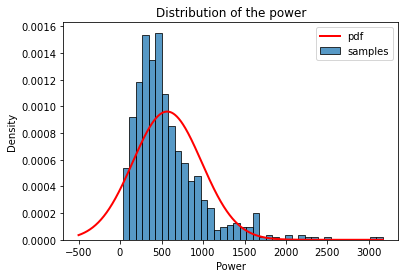

In [60]:
p = sns.histplot(power[filter_], stat = 'density', label = 'samples')
p.set_title("Distribution of the power")
p.set_xlabel("Power")
x_pdf = np.linspace(-500, power[filter_].max(), 1000)
y_pdf = scipy.stats.norm.pdf(x_pdf,loc = power[filter_].mean(), scale = power[filter_].std())
p.plot(x_pdf,y_pdf, 'r', lw = 2, label = 'pdf')
p.legend()
plt.show()

The peak frequency is:  1.4635Hz
This corresponds to a bpm of: 87.81


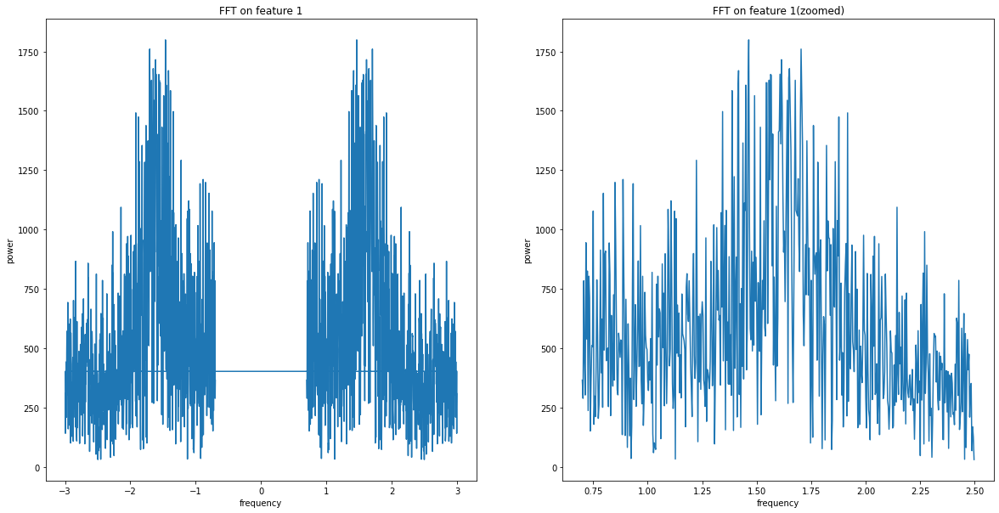

In [61]:
mean_power = power[filter_].mean()
std_power= np.std(power[filter_])

mask = (np.abs(power)<= (mean_power+3*std_power)) & (np.abs(power) >= (mean_power-3*std_power))
mask = mask & filter_
fft_freq_filtered =fft_freq[mask]
power_filtered = power[mask]

peak_freq = fft_freq_filtered[power_filtered.argmax()]
ax = fft_plot(0, 2.5, fft_freq_filtered, power_filtered, "FFT on feature 1")

print("The peak frequency is: ",str(np.round(peak_freq,4))+"Hz")
print("This corresponds to a bpm of:",str(np.round(peak_freq*60,2)))

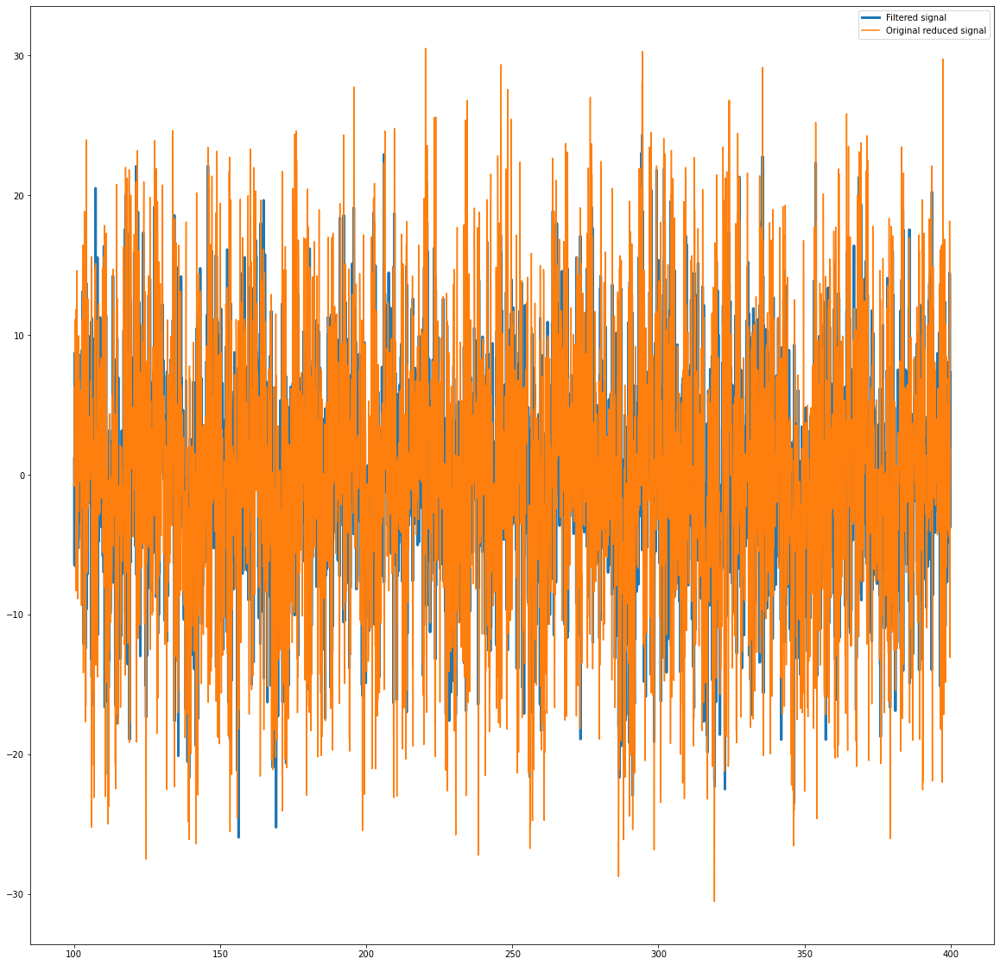

In [62]:
final_mask = mask
fft_sig_copy = fft_sig.copy()
fft_sig_copy[final_mask]=0
filtered_sig = fftpack.ifft(fft_sig_copy)
filtered_sig = np.real(filtered_sig)

plt.figure(figsize=(20, 20))

plt.plot(real_timestamp[filter_data], filtered_sig, linewidth=3, label='Filtered signal')
plt.plot(real_timestamp[filter_data],new_dataset["Feature 1"] , label='Original reduced signal')
plt.legend()

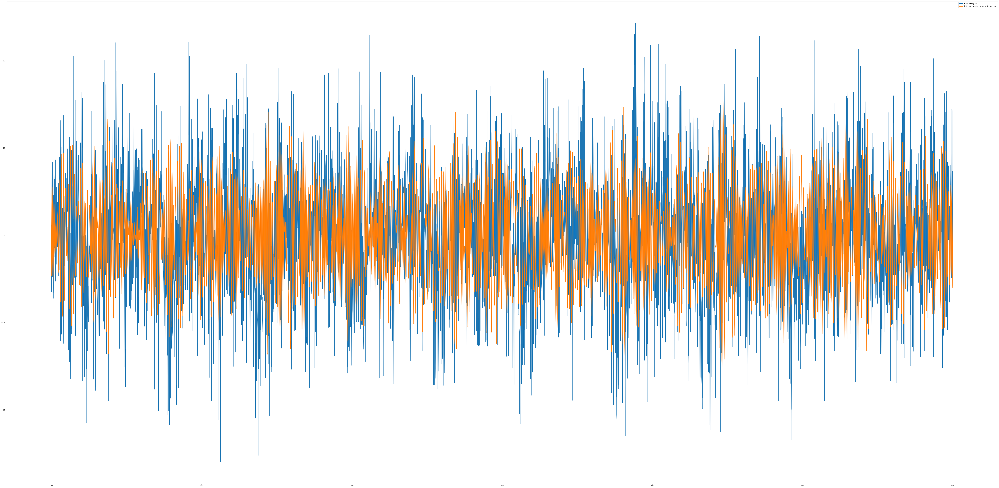

In [63]:
final_mask = (np.abs(np.abs(fft_freq) - peak_freq)>= 0.4)
fft_sig[final_mask]=0
filtered_sig2 = fftpack.ifft(fft_sig)
filtered_sig2 = np.real(filtered_sig2)

plt.figure(figsize=(100, 50))

plt.plot(real_timestamp[filter_data], filtered_sig, linewidth=3, label='Filtered signal')
plt.plot(real_timestamp[filter_data],filtered_sig2 , label='Filtering exactly the peak frequency',linewidth=3)
plt.legend()

## 2.5 Heart rate and Heart rate variability

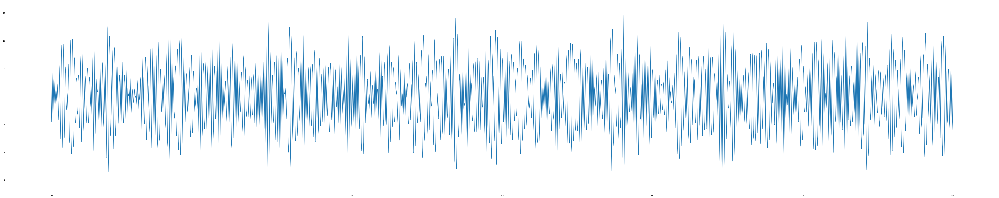

In [64]:
plt.figure(figsize=(100, 20))
plt.plot(real_timestamp[filter_data],filtered_sig2 , label='Filtering exactly the peak frequency')

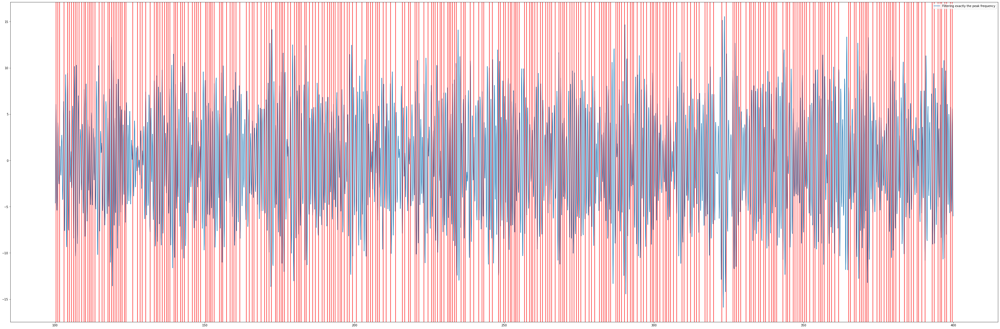

In [65]:
plt.figure(figsize=(60, 20))
plt.plot(real_timestamp[filter_data],filtered_sig2 , label='Filtering exactly the peak frequency')
idx_minima = signal.argrelextrema(filtered_sig, np.greater, order = 6)

for i in idx_minima[0]:
    plt.axvline(real_timestamp[filter_data][i], color = 'r')
plt.legend()

Duration of the dataset (excluding start-end noise): 60 seconds
Beats in these 60 seconds:  332


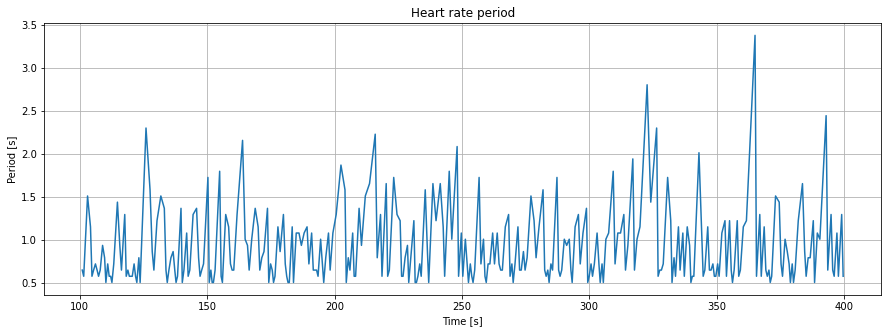

In [66]:
total_beats = len(idx_minima[0])

print('Duration of the dataset (excluding start-end noise): 60 seconds')
print('Beats in these 60 seconds: ',total_beats)

intervals = []

for i in idx_minima[0]:
    intervals.append(real_timestamp[filter_data][i])
    
periods_diff = []

for i in range(1,len(intervals)):
    periods_diff.append(intervals[i]-intervals[i-1])
        
#plot the period vs time
plt.figure(figsize=(15,5))
plt.plot(intervals[1:], periods_diff)
plt.title("Heart rate period")
plt.xlabel('Time [s]')
plt.ylabel('Period [s]')
plt.grid()
plt.show()

Mean HRV (intended as period variability) calculated on whole dataset: 0.42 s


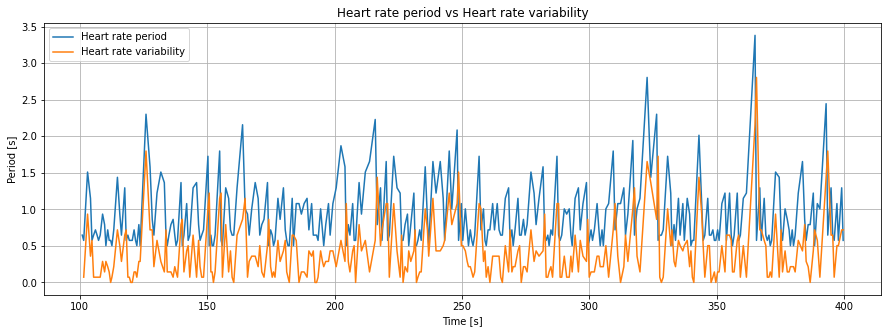

In [67]:
#plot the period variability vs time
periods_diff_diff = []
for i in range(1,len(periods_diff)):
    periods_diff_diff.append(abs(periods_diff[i]-periods_diff[i-1]))
        
mean_brv = np.mean(periods_diff_diff) 
print("Mean HRV (intended as period variability) calculated on whole dataset:", round(mean_brv,2), "s")

plt.figure(figsize=(15,5))
plt.plot(intervals[1:],periods_diff,label='Heart rate period')
plt.title("Heart rate period vs Heart rate variability")
plt.plot(intervals[2:],periods_diff_diff,label='Heart rate variability')
plt.xlabel('Time [s]')
plt.ylabel('Period [s]')
plt.grid()
plt.legend()
plt.show()

## 2.6 Kernel density estimation of the BPM

In [68]:
bpm_instant = [(1/i)*60 for i in periods_diff]

The number of bins used is: 9


Text(0.5, 1.0, 'BPM distribution on the collected data')

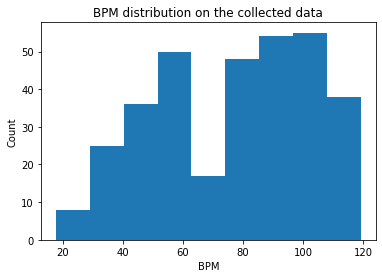

In [69]:
n = len(bpm_instant)
bins = int(1 + 3.322*mt.log(n,10))
print("The number of bins used is:",bins)
plt.hist(bpm_instant,bins = bins);
plt.xlabel("BPM")
plt.ylabel("Count")
plt.title("BPM distribution on the collected data")

In [70]:
h = 1.06*np.std(bpm_instant)*n**(-0.2)
kde = KernelDensity(bandwidth= h, kernel='gaussian')
kde.fit(np.sort(np.array(bpm_instant)).reshape(-1,1))
score = kde.score_samples(np.sort(np.array(bpm_instant)).reshape(-1,1))

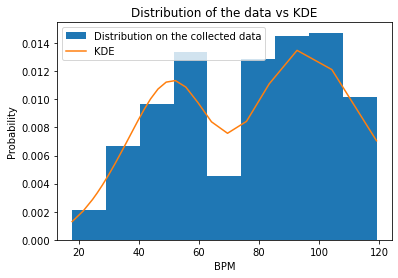

In [71]:
plt.hist(bpm_instant,bins = bins,density=True,label="Distribution on the collected data");
plt.plot(np.sort(np.array(bpm_instant)).reshape(-1,1),np.exp(score), label = "KDE")
plt.xlabel("BPM")
plt.ylabel("Probability")
plt.title("Distribution of the data vs KDE")
plt.legend()

## References

Here are reported a few papers used to better comprehend and analyze the data reported by the sensors. 

<ol>
    <li>"IMU Calibration Without Mechanical Equipment (Calibrazione di IMU svincolata da apparati meccanici)", David Tedaldi and Emanuele Menegatti, <i>University of Padova</i>, 2013 (<a>http://tesi.cab.unipd.it/44087/1/Thesis.pdf</a>)</li>
    <li>Romano C, Schena E, Formica D, Massaroni C. "Comparison between Chest-Worn Accelerometer and Gyroscope Performance for Heart Rate and Respiratory Rate Monitoring". (<a>https://pubmed.ncbi.nlm.nih.gov/36290971/</a>)</li>
</ol>